Image saved to trump.jpg


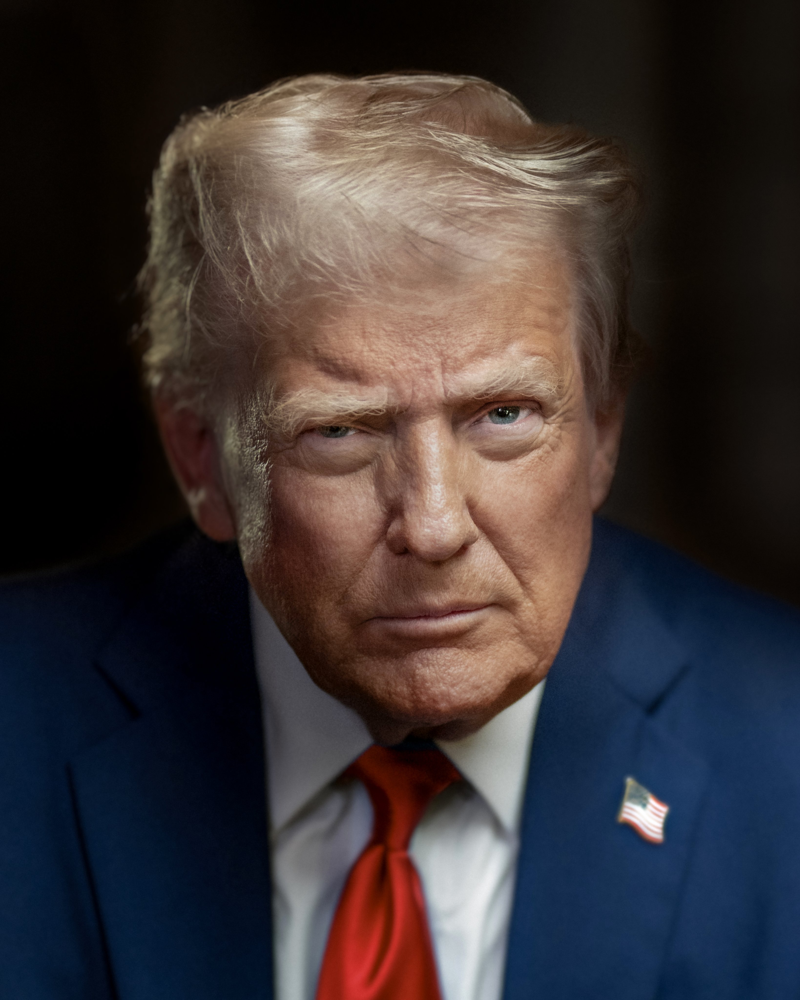

In [2]:
import requests
from PIL import Image
import os

url_trump = "https://upload.wikimedia.org/wikipedia/commons/1/16/Official_Presidential_Portrait_of_President_Donald_J._Trump_%282025%29.jpg"

headers = {
    "User-Agent": "Mozilla/5.0 (Windows NT 10.0; Win64; x64) "
                  "AppleWebKit/537.36 (KHTML, like Gecko) "
                  "Chrome/115.0 Safari/537.36"
}

# Use relative path (same directory as notebook)
image_path = "trump.jpg"

# Download and save only if not already present
if not os.path.exists(image_path):
    response = requests.get(url_trump, headers=headers)
    response.raise_for_status()
    with open(image_path, "wb") as f:
        f.write(response.content)
    print(f"Image saved to {image_path}")
else:
    print(f"Image already exists at {image_path}")

# Load from local file
img_trump = Image.open(image_path)
img_trump

In [3]:
from torchvision import transforms
preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )])

In [4]:
img_t = preprocess(img_trump)
import torch
batch_t = torch.unsqueeze(img_t, 0)

In [5]:
import torch
import clip
from PIL import Image

device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

text = clip.tokenize(["Donald Trump", "Joe Biden", "a man in a suit"]).to(device)

with torch.no_grad():
    image_features = model.encode_image(batch_t)
    text_features = model.encode_text(text)

    logits_per_image, _ = model(batch_t, text)
    probs = logits_per_image.softmax(dim=-1).cpu().numpy()

print(probs)

[[0.97781485 0.00197979 0.02020545]]
